# Weather Forecast - London

## Data Source

https://www.kaggle.com/datasets/emmanuelfwerr/london-weather-data

Historical London weather data from 1979 to 2021.
The dataset featured below was created by reconciling measurements from requests of individual weather attributes provided by the European Climate Assessment (ECA). The measurements of this particular dataset were recorded by a weather station near Heathrow airport in London, UK.

date: recorded date of measurement<br>
cloud_cover: cloud cover measurement in oktas<br>
sunshine: sunshine measurement in hours (hrs)<br>
global_radiation: irradiance measurement in Watt per square meter (W/m2)<br>
max_temp: maximum temperature recorded in degrees Celsius (°C)<br>
mean_temp: mean temperature in degrees Celsius (°C)<br>
min_temp: minimum temperature recorded in degrees Celsius (°C)<br>
precipitation: precipitation measurement in millimeters (mm)<br>
pressure: pressure measurement in Pascals (Pa)<br>
snow_depth: snow depth measurement in centimeters (cm)

## Data Preparation

In [1]:
# Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
# Loading Dataset
df = pd.read_csv("london_weather.csv")

In [3]:
# Data Preview
print(df.head())

       date  cloud_cover  sunshine  global_radiation  max_temp  mean_temp  \
0  19790101          2.0       7.0              52.0       2.3       -4.1   
1  19790102          6.0       1.7              27.0       1.6       -2.6   
2  19790103          5.0       0.0              13.0       1.3       -2.8   
3  19790104          8.0       0.0              13.0      -0.3       -2.6   
4  19790105          6.0       2.0              29.0       5.6       -0.8   

   min_temp  precipitation  pressure  snow_depth  
0      -7.5            0.4  101900.0         9.0  
1      -7.5            0.0  102530.0         8.0  
2      -7.2            0.0  102050.0         4.0  
3      -6.5            0.0  100840.0         2.0  
4      -1.4            0.0  102250.0         1.0  


In [4]:
# Number of rows and columns in the DataFrame
df.shape

(15341, 10)

In [9]:
# The information about DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15341 entries, 0 to 15340
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   date              15341 non-null  int64  
 1   cloud_cover       15322 non-null  float64
 2   sunshine          15341 non-null  float64
 3   global_radiation  15322 non-null  float64
 4   max_temp          15335 non-null  float64
 5   mean_temp         15305 non-null  float64
 6   min_temp          15339 non-null  float64
 7   precipitation     15335 non-null  float64
 8   pressure          15337 non-null  float64
 9   snow_depth        13900 non-null  float64
dtypes: float64(9), int64(1)
memory usage: 1.2 MB


In [11]:
df.describe()

,date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth
count,1.534100e+04,15322.000000,15341.000000,15322.000000,15335.000000,15305.000000,15339.000000,15335.000000,15337.000000,13900.000000
mean,1.999567e+07,5.268242,4.350238,118.756951,15.388777,11.475511,7.559867,1.668634,101536.605594,0.037986
std,1.212176e+05,2.070072,4.028339,88.898272,6.554754,5.729709,5.326756,3.738540,1049.722604,0.545633
min,1.979010e+07,0.000000,0.000000,8.000000,-6.200000,-7.600000,-11.800000,0.000000,95960.000000,0.000000
25%,1.989070e+07,4.000000,0.500000,41.000000,10.500000,7.000000,3.500000,0.000000,100920.000000,0.000000
50%,2.000010e+07,6.000000,3.500000,95.000000,15.000000,11.400000,7.800000,0.000000,101620.000000,0.000000
75%,2.010070e+07,7.000000,7.200000,186.000000,20.300000,16.000000,11.800000,1.600000,102240.000000,0.000000
max,2.020123e+07,9.000000,16.000000,402.000000,37.900000,29.000000,22.300000,61.800000,104820.000000,22.000000


In [13]:
# Checking for the null values
df.isnull().sum()

date                   0
cloud_cover           19
sunshine               0
global_radiation      19
max_temp               6
mean_temp             36
min_temp               2
precipitation          6
pressure               4
snow_depth          1441
dtype: int64

In [15]:
# The data type of the 'date' column is int64. It needs to be converted into DateTime.
df['date'] = pd.to_datetime(df['date'],format = '%Y%m%d')
df['date'].dtype

dtype('<M8[ns]')

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15341 entries, 0 to 15340
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              15341 non-null  datetime64[ns]
 1   cloud_cover       15322 non-null  float64       
 2   sunshine          15341 non-null  float64       
 3   global_radiation  15322 non-null  float64       
 4   max_temp          15335 non-null  float64       
 5   mean_temp         15305 non-null  float64       
 6   min_temp          15339 non-null  float64       
 7   precipitation     15335 non-null  float64       
 8   pressure          15337 non-null  float64       
 9   snow_depth        13900 non-null  float64       
dtypes: datetime64[ns](1), float64(9)
memory usage: 1.2 MB


In [17]:
df.head()

,date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth
0,1979-01-01,2.0,7.0,52.0,2.3,-4.1,-7.5,0.4,101900.0,9.0
1,1979-01-02,6.0,1.7,27.0,1.6,-2.6,-7.5,0.0,102530.0,8.0
2,1979-01-03,5.0,0.0,13.0,1.3,-2.8,-7.2,0.0,102050.0,4.0
3,1979-01-04,8.0,0.0,13.0,-0.3,-2.6,-6.5,0.0,100840.0,2.0
4,1979-01-05,6.0,2.0,29.0,5.6,-0.8,-1.4,0.0,102250.0,1.0


In [18]:
# Add new 'month' column
df['month']=df['date'].dt.month
df.head()

,date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth,month
0,1979-01-01,2.0,7.0,52.0,2.3,-4.1,-7.5,0.4,101900.0,9.0,1
1,1979-01-02,6.0,1.7,27.0,1.6,-2.6,-7.5,0.0,102530.0,8.0,1
2,1979-01-03,5.0,0.0,13.0,1.3,-2.8,-7.2,0.0,102050.0,4.0,1
3,1979-01-04,8.0,0.0,13.0,-0.3,-2.6,-6.5,0.0,100840.0,2.0,1
4,1979-01-05,6.0,2.0,29.0,5.6,-0.8,-1.4,0.0,102250.0,1.0,1


In [23]:
# Add a new column for the season

# Dictionary for months
season_dict = {1: 4,
               2: 4,
               3: 1, 
               4: 1,
               5: 1,
               6: 2,
               7: 2,
               8: 2,
               9: 3,
               10: 3,
               11: 3,
               12: 4}
df['season'] = df['month'].apply(lambda x: season_dict[x])
df.head()

,date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth,month,season
0,1979-01-01,2.0,7.0,52.0,2.3,-4.1,-7.5,0.4,101900.0,9.0,1,4
1,1979-01-02,6.0,1.7,27.0,1.6,-2.6,-7.5,0.0,102530.0,8.0,1,4
2,1979-01-03,5.0,0.0,13.0,1.3,-2.8,-7.2,0.0,102050.0,4.0,1,4
3,1979-01-04,8.0,0.0,13.0,-0.3,-2.6,-6.5,0.0,100840.0,2.0,1,4
4,1979-01-05,6.0,2.0,29.0,5.6,-0.8,-1.4,0.0,102250.0,1.0,1,4


In [25]:
# Add new 'year' column
df['year']=df['date'].dt.year
df.head()

,date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth,month,season,year
0,1979-01-01,2.0,7.0,52.0,2.3,-4.1,-7.5,0.4,101900.0,9.0,1,4,1979
1,1979-01-02,6.0,1.7,27.0,1.6,-2.6,-7.5,0.0,102530.0,8.0,1,4,1979
2,1979-01-03,5.0,0.0,13.0,1.3,-2.8,-7.2,0.0,102050.0,4.0,1,4,1979
3,1979-01-04,8.0,0.0,13.0,-0.3,-2.6,-6.5,0.0,100840.0,2.0,1,4,1979
4,1979-01-05,6.0,2.0,29.0,5.6,-0.8,-1.4,0.0,102250.0,1.0,1,4,1979


In [27]:
# Pressure measurement: Convert from Pascals (Pa) to kPa
# 1 Pa = 0.001 kPa
df['pressure'] = round(df['pressure']/1000,1)
df.head()

,date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth,month,season,year
0,1979-01-01,2.0,7.0,52.0,2.3,-4.1,-7.5,0.4,101.9,9.0,1,4,1979
1,1979-01-02,6.0,1.7,27.0,1.6,-2.6,-7.5,0.0,102.5,8.0,1,4,1979
2,1979-01-03,5.0,0.0,13.0,1.3,-2.8,-7.2,0.0,102.0,4.0,1,4,1979
3,1979-01-04,8.0,0.0,13.0,-0.3,-2.6,-6.5,0.0,100.8,2.0,1,4,1979
4,1979-01-05,6.0,2.0,29.0,5.6,-0.8,-1.4,0.0,102.2,1.0,1,4,1979


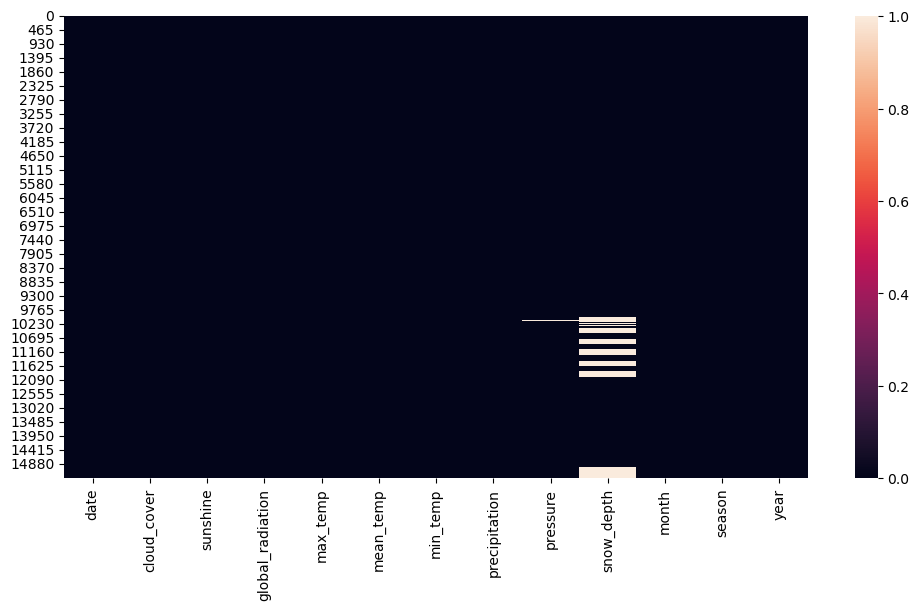

In [29]:
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull());

## Resample Data

In [31]:
# The dataset is resampled to month and year according to the mean of values for further analysis 
# and visualization.
monthly_data = df.set_index('date').resample('M').mean()[1:]
yearly_data = df.set_index('date').resample('Y').mean()[1:]

# Converting 'month' & 'year' from float to int
monthly_data['month'] = monthly_data['month'].astype(int)
monthly_data['year'] = monthly_data['year'].astype(int)
yearly_data['year'] = yearly_data['year'].astype(int)

yearly_data.pop('month')

/var/folders/k4/jzq2s7kj6k9053ps6nmw21fw0000gn/T/ipykernel_18044/307007003.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_data = df.set_index('date').resample('M').mean()[1:]
/var/folders/k4/jzq2s7kj6k9053ps6nmw21fw0000gn/T/ipykernel_18044/307007003.py:4: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly_data = df.set_index('date').resample('Y').mean()[1:]


date
1980-12-31    6.513661
1981-12-31    6.526027
1982-12-31    6.526027
1983-12-31    6.526027
1984-12-31    6.513661
1985-12-31    6.526027
1986-12-31    6.526027
1987-12-31    6.526027
1988-12-31    6.513661
1989-12-31    6.526027
1990-12-31    6.526027
1991-12-31    6.526027
1992-12-31    6.513661
1993-12-31    6.526027
1994-12-31    6.526027
1995-12-31    6.526027
1996-12-31    6.513661
1997-12-31    6.526027
1998-12-31    6.526027
1999-12-31    6.526027
2000-12-31    6.513661
2001-12-31    6.526027
2002-12-31    6.526027
2003-12-31    6.526027
2004-12-31    6.513661
2005-12-31    6.526027
2006-12-31    6.526027
2007-12-31    6.526027
2008-12-31    6.513661
2009-12-31    6.526027
2010-12-31    6.526027
2011-12-31    6.526027
2012-12-31    6.513661
2013-12-31    6.526027
2014-12-31    6.526027
2015-12-31    6.526027
2016-12-31    6.513661
2017-12-31    6.526027
2018-12-31    6.526027
2019-12-31    6.526027
2020-12-31    6.513661
Freq: YE-DEC, Name: month, dtype: float64

In [32]:
# Data resampled according to month
monthly_data.head()

,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth,month,season,year
date,,,,,,,,,,,,
1979-02-28,6.360000,1.889286,45.214286,4.532143,2.042857,-0.428571,1.571429,101.157143,0.107143,2,4.0,1979
1979-03-31,5.967742,3.212903,93.354839,9.238710,5.587097,1.993548,3.061290,100.458065,0.032258,3,1.0,1979
1979-04-30,6.133333,3.543333,134.166667,12.520000,8.743333,4.810000,2.586667,101.156667,0.000000,4,1.0,1979
1979-05-31,5.290323,6.470968,204.064516,16.206452,11.490323,7.151613,2.806452,101.364516,0.000000,5,1.0,1979
1979-06-30,5.666667,4.676667,187.266667,18.996667,15.040000,11.066667,1.253333,101.860000,0.000000,6,2.0,1979


In [33]:
# Round the values
monthly_data["cloud_cover"] = round(monthly_data["cloud_cover"],1)
monthly_data["sunshine"] = round(monthly_data["sunshine"],1)
monthly_data["global_radiation"] = monthly_data["global_radiation"].astype(int)
monthly_data["max_temp"] = round(monthly_data["max_temp"],1)
monthly_data["mean_temp"] = round(monthly_data["mean_temp"],1)
monthly_data["min_temp"] = round(monthly_data["min_temp"],1)
monthly_data["precipitation"] = round(monthly_data["precipitation"],1)
monthly_data["pressure"] = round(monthly_data["pressure"],1)
monthly_data["snow_depth"] = round(monthly_data["snow_depth"],0)
monthly_data.head()

,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth,month,season,year
date,,,,,,,,,,,,
1979-02-28,6.4,1.9,45,4.5,2.0,-0.4,1.6,101.2,0.0,2,4.0,1979
1979-03-31,6.0,3.2,93,9.2,5.6,2.0,3.1,100.5,0.0,3,1.0,1979
1979-04-30,6.1,3.5,134,12.5,8.7,4.8,2.6,101.2,0.0,4,1.0,1979
1979-05-31,5.3,6.5,204,16.2,11.5,7.2,2.8,101.4,0.0,5,1.0,1979
1979-06-30,5.7,4.7,187,19.0,15.0,11.1,1.3,101.9,0.0,6,2.0,1979


In [34]:
# Data resampled according to year
yearly_data.head()

,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth,season,year
date,,,,,,,,,,,
1980-12-31,5.379781,4.142077,114.704918,14.176230,10.370492,6.587978,1.606831,101.537978,0.000000,2.494536,1980
1981-12-31,5.598901,3.601370,108.054795,14.063562,10.320000,6.574795,1.861918,101.504110,0.189041,2.490411,1981
1982-12-31,5.241096,4.142740,117.273973,15.004658,10.998904,7.006301,1.780274,101.540548,0.306849,2.490411,1982
1983-12-31,5.254795,4.101644,116.687671,15.248767,11.237260,7.227397,1.465753,101.640548,0.008219,2.490411,1983
1984-12-31,5.301370,4.292077,118.551913,14.923497,10.942350,6.943443,1.753279,101.493443,0.000000,2.494536,1984


In [35]:
# Round the values
yearly_data["cloud_cover"] = round(yearly_data["cloud_cover"],1)
yearly_data["sunshine"] = round(yearly_data["sunshine"],1)
yearly_data["global_radiation"] = yearly_data["global_radiation"].astype(int)
yearly_data["max_temp"] = round(yearly_data["max_temp"],1)
yearly_data["mean_temp"] = round(yearly_data["mean_temp"],1)
yearly_data["min_temp"] = round(yearly_data["min_temp"],1)
yearly_data["precipitation"] = round(yearly_data["precipitation"],1)
yearly_data["pressure"] = round(yearly_data["pressure"],1)
yearly_data["snow_depth"] = round(yearly_data["snow_depth"],0)
yearly_data.head()

,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth,season,year
date,,,,,,,,,,,
1980-12-31,5.4,4.1,114,14.2,10.4,6.6,1.6,101.5,0.0,2.494536,1980
1981-12-31,5.6,3.6,108,14.1,10.3,6.6,1.9,101.5,0.0,2.490411,1981
1982-12-31,5.2,4.1,117,15.0,11.0,7.0,1.8,101.5,0.0,2.490411,1982
1983-12-31,5.3,4.1,116,15.2,11.2,7.2,1.5,101.6,0.0,2.490411,1983
1984-12-31,5.3,4.3,118,14.9,10.9,6.9,1.8,101.5,0.0,2.494536,1984


## Exploratory Data Analysis

## Visualizing the Mean Temperature from the year 1979 to 2021.

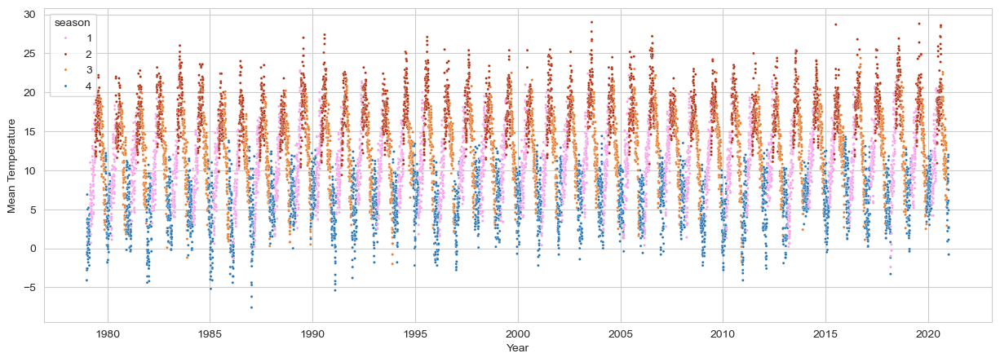

In [38]:
palette = {1: '#f99cea', 2: '#b12908', 3:'#e77828', 4:'#2071b1'}
plt.figure(figsize=(15,5))
sns.set_style("whitegrid")

sns.scatterplot(x='date', y='mean_temp',
                data=df,
                hue="season", palette=palette,
                s=5)
plt.xlabel("Year");
plt.ylabel("Mean Temperature");

## Visualizing the Precipitation from the year 1979 to 2021.

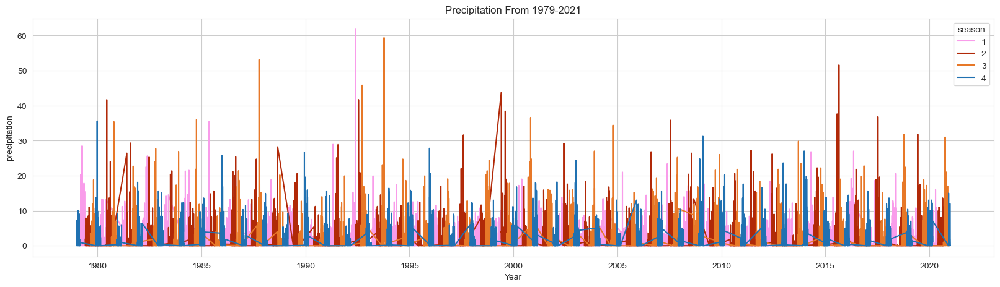

In [40]:
#palette = {1: '#f99cea', 2: '#b12908', 3:'#e77828', 4:'#2071b1'}
plt.figure(figsize=(20,5))
plt.title("Precipitation From 1979-2021")
# Create a time series plot
sns.lineplot(x='date', y='precipitation',
             data=df,
             hue='season', palette=palette,
             )
plt.xlabel("Year");

## Visualizing the Irradiance from the year 1979 to 2021.

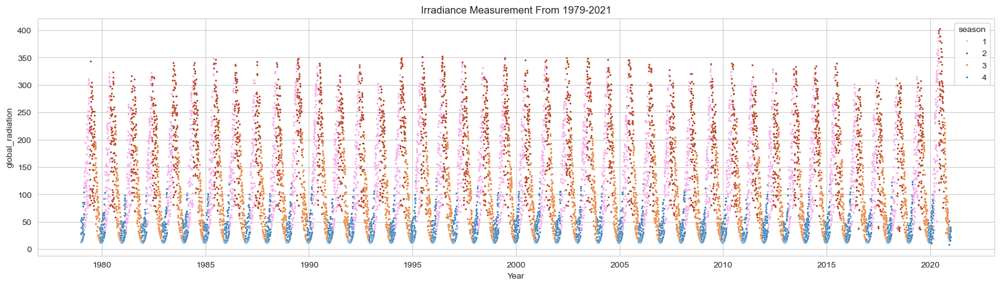

In [42]:
plt.figure(figsize=(20,5))
plt.title("Irradiance Measurement From 1979-2021")
# Create a time series plot
sns.scatterplot(x='date', y='global_radiation',
             data=df,
             hue='season', palette=palette,
             s=5)
plt.xlabel("Year");

## Visualizing Pressue from the year 1979 to 2021.

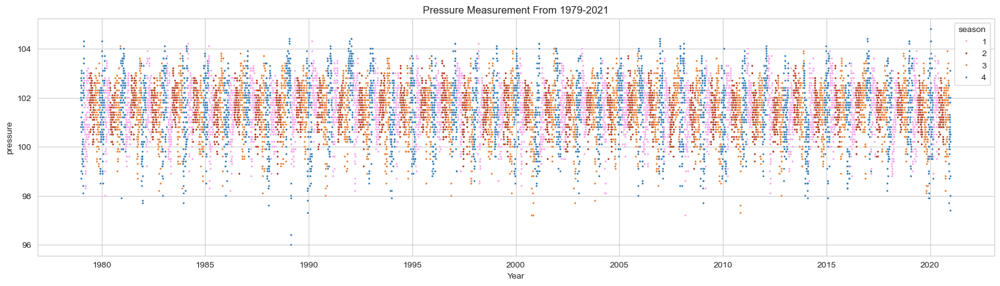

In [44]:
plt.figure(figsize=(20,5))
plt.title("Pressure Measurement From 1979-2021")
# Create a time series plot
sns.scatterplot(x='date', y='pressure',
                data=df,
                hue='season', palette=palette,
                s=5)
plt.xlabel("Year");

## Variation of Monthly Average Temperature and Precipitation With Time

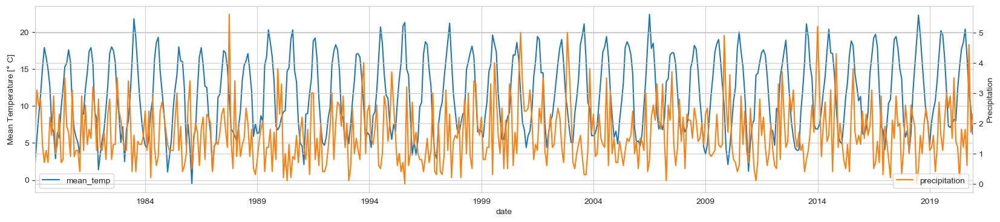

In [46]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()  # add a second y-axis
fig.set_figheight(4)
fig.set_figwidth(20)

monthly_data['mean_temp'].plot(ax=ax1, c='tab:blue')
monthly_data['precipitation'].plot(ax=ax2, c='tab:orange')
ax1.set_ylabel(r'Mean Temperature [$\degree$ C]')
ax2.set_ylabel(r'Precipitation')
ax1.legend(loc='lower left')
ax2.legend(loc='lower right');

<Axes: xlabel='mean_temp', ylabel='precipitation'>

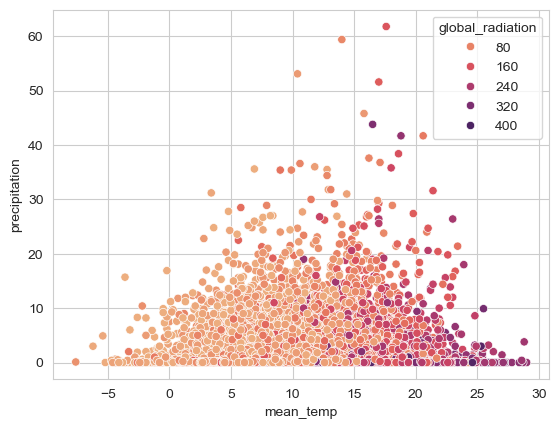

In [47]:
sns.scatterplot(x='mean_temp',
                y='precipitation',
                data=df,
                hue="global_radiation",
                palette="flare")

## Variation of Monthly Average Temperature and Irradiance With Time

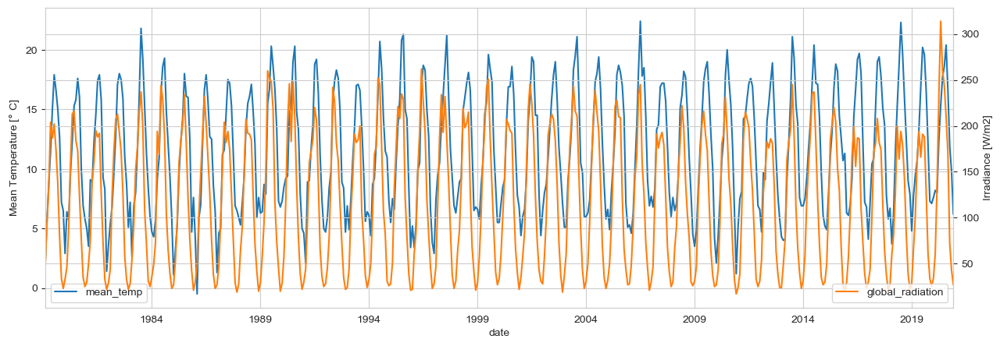

In [49]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()  # add a second y-axis
fig.set_figheight(5)
fig.set_figwidth(15)

monthly_data['mean_temp'].plot(ax=ax1, c='tab:blue')
monthly_data['global_radiation'].plot(ax=ax2, c='tab:orange')
ax1.set_ylabel(r'Mean Temperature [$\degree$ C]')
ax2.set_ylabel(r'Irradiance [W/m2]')
ax1.legend(loc='lower left')
ax2.legend(loc='lower right');

<Axes: xlabel='mean_temp', ylabel='global_radiation'>

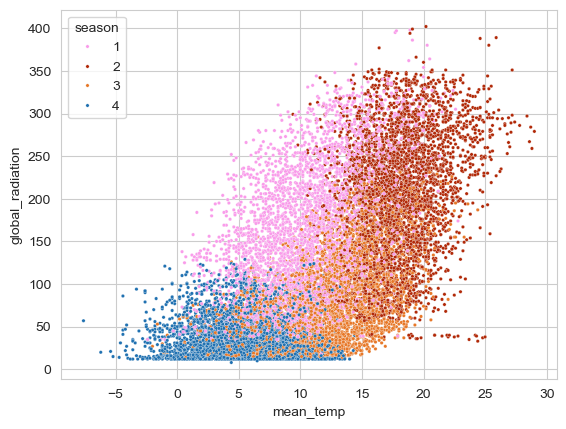

In [51]:
sns.scatterplot(x='mean_temp',
                y='global_radiation',
                hue="season", palette=palette,
                data=df,
                s=6)

## Variation of Monthly Average Temperature and Pressure With Time

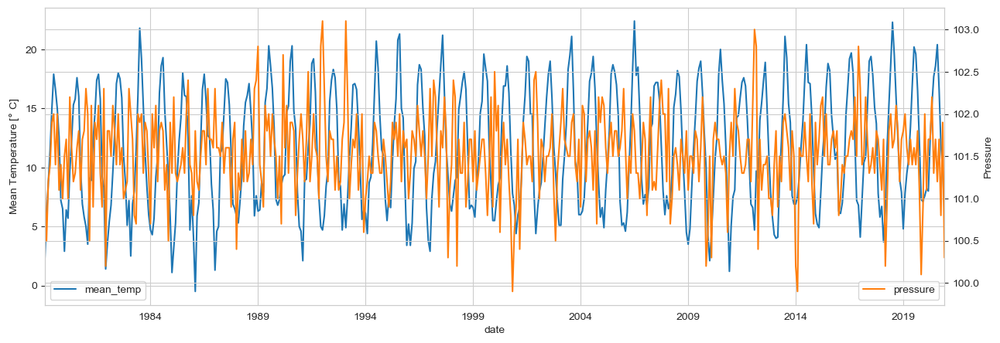

In [58]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()  # add a second y-axis
fig.set_figheight(5)
fig.set_figwidth(15)

monthly_data['mean_temp'].plot(ax=ax1, c='tab:blue')
monthly_data['pressure'].plot(ax=ax2, c='tab:orange')
ax1.set_ylabel(r'Mean Temperature [$\degree$ C]')
ax2.set_ylabel(r'Pressure')
ax1.legend(loc='lower left')
ax2.legend(loc='lower right');

<Axes: xlabel='mean_temp', ylabel='pressure'>

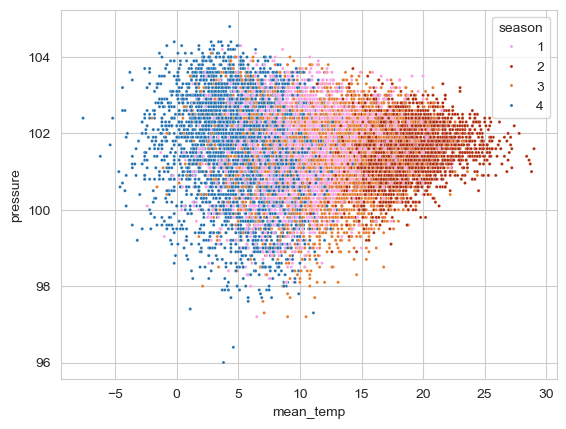

In [59]:
sns.scatterplot(x='mean_temp',
                y='pressure',
                hue="season", palette=palette,
                data=df,
                s=5)

## Average Temperature in each month from 1979 to 2021

In [61]:
avg_monthly_temp = pd.DataFrame(df.groupby([df["date"].dt.month])["mean_temp"].mean())
avg_monthly_temp.reset_index(inplace=True)

In [62]:
avg_monthly_temp

,date,mean_temp
0,1,5.162462
1,2,5.398986
2,3,7.606091
3,4,10.097615
4,5,13.398921
5,6,16.459459
6,7,18.795158
7,8,18.451424
8,9,15.735959
9,10,12.139137


/var/folders/k4/jzq2s7kj6k9053ps6nmw21fw0000gn/T/ipykernel_18044/3980338802.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date',y='mean_temp', data=avg_monthly_temp, palette="flare")


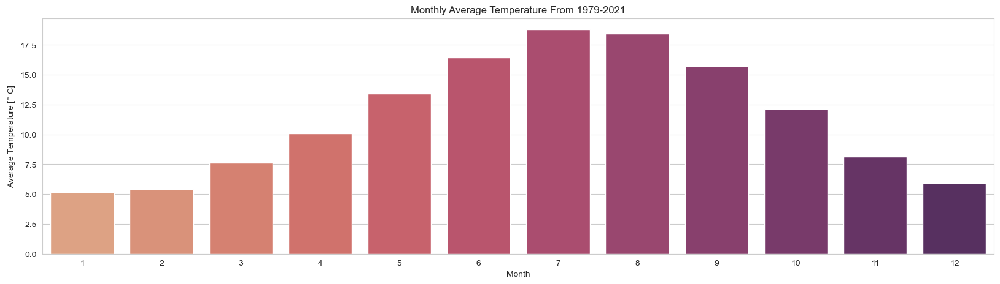

In [63]:
# Barplot
plt.figure(figsize=(20,5))
plt.title("Monthly Average Temperature From 1979-2021")
sns.barplot(x='date',y='mean_temp', data=avg_monthly_temp, palette="flare")
plt.xlabel("Month");
plt.ylabel("Average Temperature [$\degree$ C]");

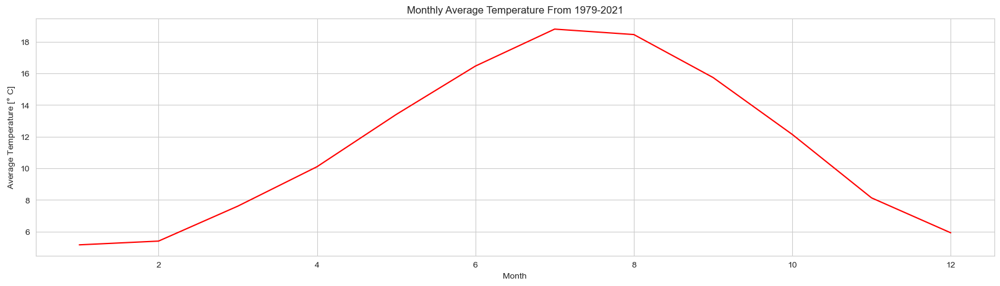

In [64]:
# Lineplot
plt.figure(figsize=(20,5))
plt.title("Monthly Average Temperature From 1979-2021")
sns.lineplot(x='date',y='mean_temp', data=avg_monthly_temp,color='red')
plt.xlabel("Month");
plt.ylabel("Average Temperature [$\degree$ C]");

## Average Precipitation in each month from 1979 to 2021

In [67]:
avg_monthly_precipitation = pd.DataFrame(df.groupby([df["date"].dt.month])["precipitation"].mean())
avg_monthly_precipitation.reset_index(inplace=True)

In [68]:
avg_monthly_precipitation

,date,precipitation
0,1,1.847849
1,2,1.492411
2,3,1.400692
3,4,1.417540
4,5,1.565308
5,6,1.622160
6,7,1.454804
7,8,1.645008
8,9,1.524683
9,10,2.191321


/var/folders/k4/jzq2s7kj6k9053ps6nmw21fw0000gn/T/ipykernel_18044/1012223259.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date',y='precipitation', data=avg_monthly_precipitation, palette="mako")


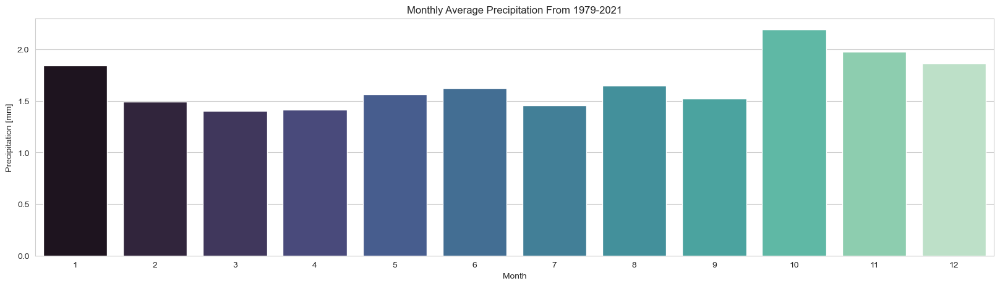

In [70]:
# Barplot
plt.figure(figsize=(20,5))
plt.title("Monthly Average Precipitation From 1979-2021")
sns.barplot(x='date',y='precipitation', data=avg_monthly_precipitation, palette="mako")
plt.xlabel("Month");
plt.ylabel("Precipitation [mm]");

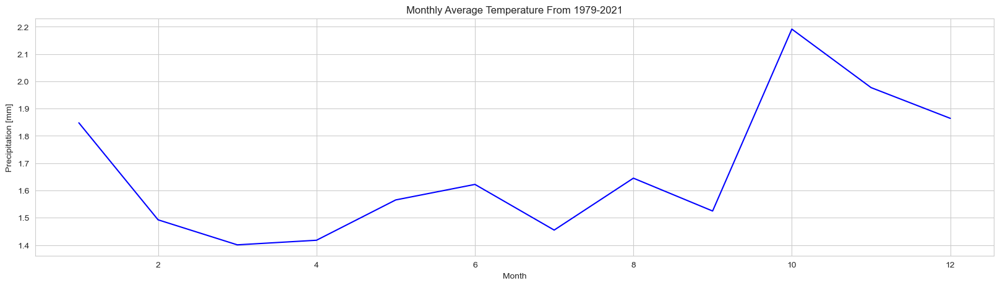

In [72]:
# Lineplot
plt.figure(figsize=(20,5))
plt.title("Monthly Average Temperature From 1979-2021")
sns.lineplot(x='date',y='precipitation', data=avg_monthly_precipitation,color='blue')
plt.xlabel("Month");
plt.ylabel("Precipitation [mm]");

## Average Irradiance in each month from 1979 to 2021

In [74]:
avg_monthly_irradiance = pd.DataFrame(df.groupby([df["date"].dt.month])["global_radiation"].mean())
avg_monthly_irradiance.reset_index(inplace=True)

In [76]:
avg_monthly_irradiance

,date,global_radiation
0,1,30.045315
1,2,53.131424
2,3,101.248080
3,4,164.061905
4,5,203.176787
5,6,212.942972
6,7,212.127021
7,8,185.424731
8,9,125.388095
9,10,73.397849


/var/folders/k4/jzq2s7kj6k9053ps6nmw21fw0000gn/T/ipykernel_18044/699832082.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date',y='global_radiation', data=avg_monthly_irradiance, palette="rocket")


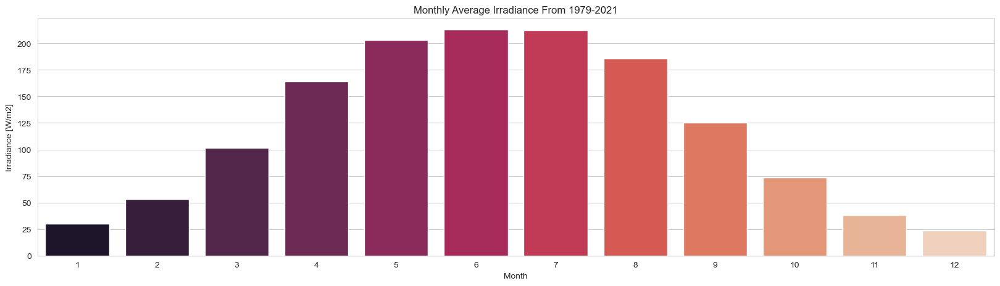

In [77]:
# Barplot
plt.figure(figsize=(20,5))
plt.title("Monthly Average Irradiance From 1979-2021")
sns.barplot(x='date',y='global_radiation', data=avg_monthly_irradiance, palette="rocket")
plt.xlabel("Month");
plt.ylabel("Irradiance [W/m2]");

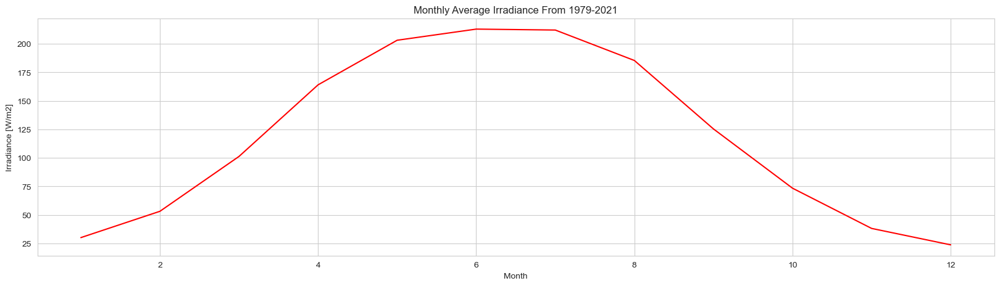

In [79]:
# Lineplot
plt.figure(figsize=(20,5))
plt.title("Monthly Average Irradiance From 1979-2021")
sns.lineplot(x='date',y='global_radiation', data=avg_monthly_irradiance,color='red')
plt.xlabel("Month");
plt.ylabel("Irradiance [W/m2]");

## Average Pressure in each month from 1979 to 2021

In [82]:
avg_monthly_pressure = pd.DataFrame(df.groupby([df["date"].dt.month])["pressure"].mean())
avg_monthly_pressure.reset_index(inplace=True)

In [100]:
avg_monthly_pressure

,date,pressure
0,1,101.590246
1,2,101.625654
2,3,101.513748
3,4,101.473492
4,5,101.567127
5,6,101.627698
6,7,101.600307
7,8,101.553958
8,9,101.636905
9,10,101.383180


/var/folders/k4/jzq2s7kj6k9053ps6nmw21fw0000gn/T/ipykernel_18044/580839008.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date',y='pressure', data=avg_monthly_pressure, palette="rocket")


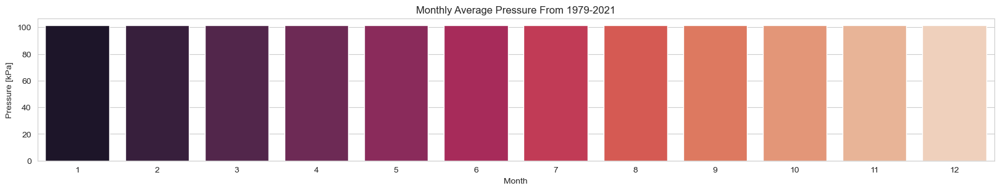

In [102]:
# Barplot
plt.figure(figsize=(20,3))
plt.title("Monthly Average Pressure From 1979-2021")
sns.barplot(x='date',y='pressure', data=avg_monthly_pressure, palette="rocket")
plt.xlabel("Month");
plt.ylabel("Pressure [kPa]");

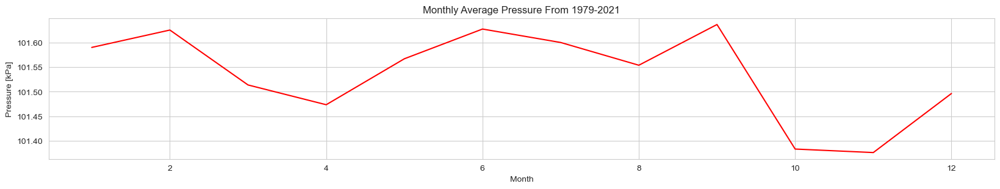

In [104]:
# Lineplot
plt.figure(figsize=(20,3))
plt.title("Monthly Average Pressure From 1979-2021")
sns.lineplot(x='date',y='pressure', data=avg_monthly_pressure,color='red')
plt.xlabel("Month");
plt.ylabel("Pressure [kPa]");

## Minimum and Maximum Temperature recorded each year

To find the minimum and maximum temperature, we create a new DataFrame with the date and Apparent Temperature and resample to year according to maximum and minimum temperature.

In [108]:
yearly_max_min = yearly_data[["year","max_temp","min_temp"]]

In [110]:
yearly_max_min.head()

,year,max_temp,min_temp
date,,,
1980-12-31,1980,14.2,6.6
1981-12-31,1981,14.1,6.6
1982-12-31,1982,15.0,7.0
1983-12-31,1983,15.2,7.2
1984-12-31,1984,14.9,6.9


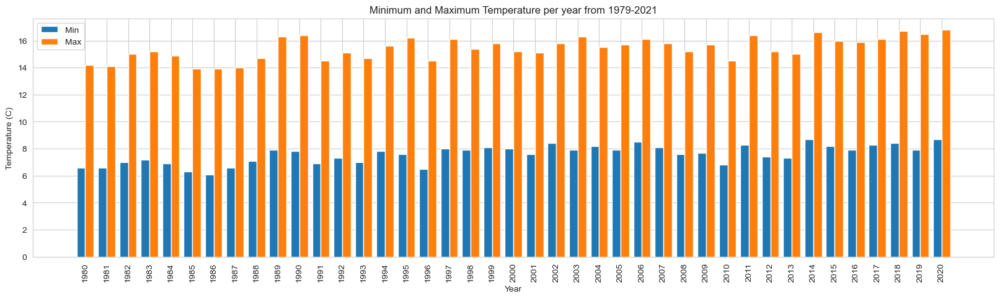

In [112]:
X_axis = np.arange(len(yearly_max_min['year']))
plt.figure(figsize=(20,5))
plt.bar(X_axis - 0.2, yearly_max_min['min_temp'], 0.4, label = 'Min')
plt.bar(X_axis + 0.2, yearly_max_min['max_temp'], 0.4, label = 'Max')
plt.xticks(X_axis, yearly_max_min['year'])
plt.xlabel("Year")
plt.ylabel("Temperature (C)")
plt.xticks(rotation=90)
plt.title("Minimum and Maximum Temperature per year from 1979-2021")
plt.legend()
plt.show()

## Correlation Between Each Feature in the Dataset

Pandas df.corr() is used to find the pairwise correlation of all columns in the data frame. Any null values are automatically excluded. For any non-numeric data type columns in the data frame, it is ignored.

In [116]:
df.corr(method ='pearson')

,date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth,month,season,year
date,1.000000,-0.107418,0.008303,0.006124,0.090610,0.099060,0.100521,0.008854,-0.014900,-0.045015,0.023688,0.005023,0.999717
cloud_cover,-0.107418,1.000000,-0.738291,-0.485973,-0.212224,-0.110556,0.048838,0.235269,-0.241945,-0.001256,-0.020270,0.091051,-0.107003
sunshine,0.008303,-0.738291,1.000000,0.852632,0.472182,0.396535,0.219082,-0.231636,0.226723,-0.034222,-0.033842,-0.340446,0.009163
global_radiation,0.006124,-0.485973,0.852632,1.000000,0.690946,0.635432,0.478119,-0.162668,0.149828,-0.061781,-0.092202,-0.611434,0.008395
max_temp,0.090610,-0.212224,0.472182,0.690946,1.000000,0.912200,0.810514,-0.071799,0.100438,-0.130594,0.183841,-0.440695,0.086319
mean_temp,0.099060,-0.110556,0.396535,0.635432,0.912200,1.000000,0.955593,-0.010462,0.004748,-0.154945,0.227076,-0.397649,0.093743
min_temp,0.100521,0.048838,0.219082,0.478119,0.810514,0.955593,1.000000,0.037233,-0.074278,-0.157882,0.251754,-0.321589,0.094605
precipitation,0.008854,0.235269,-0.231636,-0.162668,-0.071799,-0.010462,0.037233,1.000000,-0.349428,-0.001352,0.034347,0.035059,0.008024
pressure,-0.014900,-0.241945,0.226723,0.149828,0.100438,0.004748,-0.074278,-0.349428,1.000000,-0.021176,-0.039240,0.002271,-0.013990
snow_depth,-0.045015,-0.001256,-0.034222,-0.061781,-0.130594,-0.154945,-0.157882,-0.001352,-0.021176,1.000000,-0.056709,0.085749,-0.043567


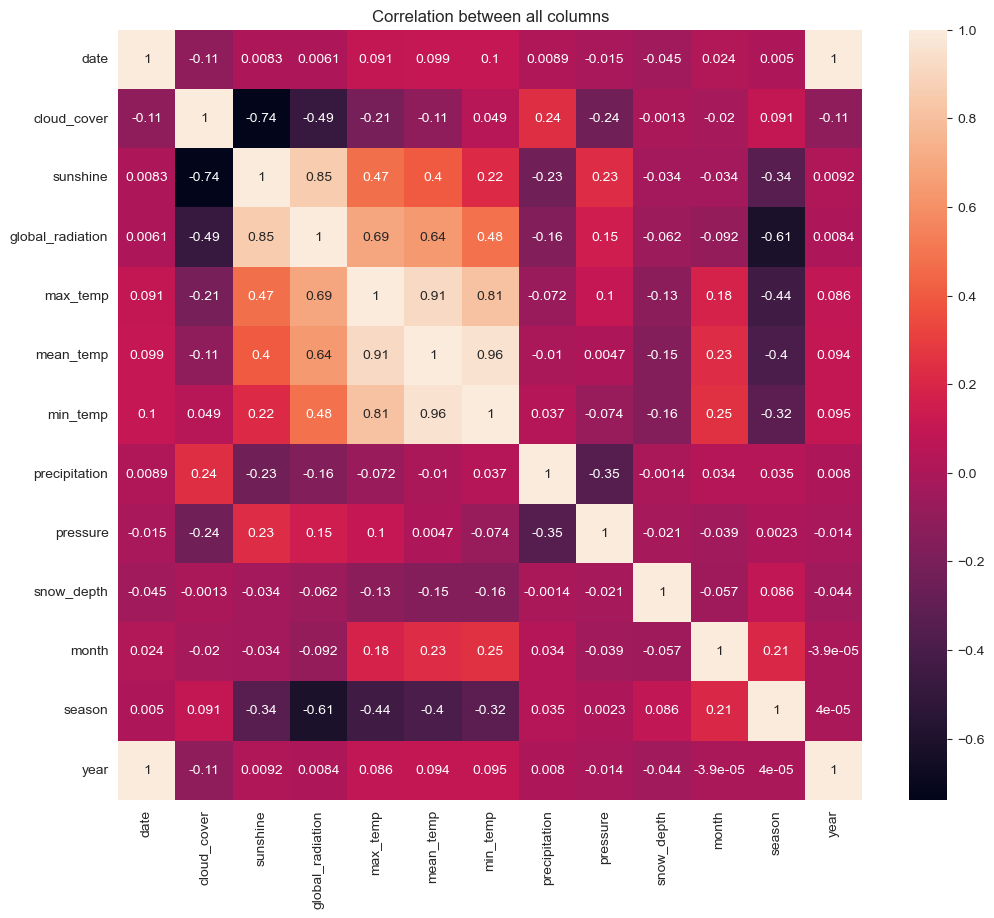

In [118]:
plt.figure(figsize=(12,10))
plt.title("Correlation between all columns")
sns.heatmap(data= df.corr(), cmap="rocket", annot=True)
plt.show()

## Correlation Between Apparent Temperature and Precipitation

The pairplot function creates a grid of Axes such that each variable in data will be shared in the y-axis across a single row and in the x-axis across a single column.

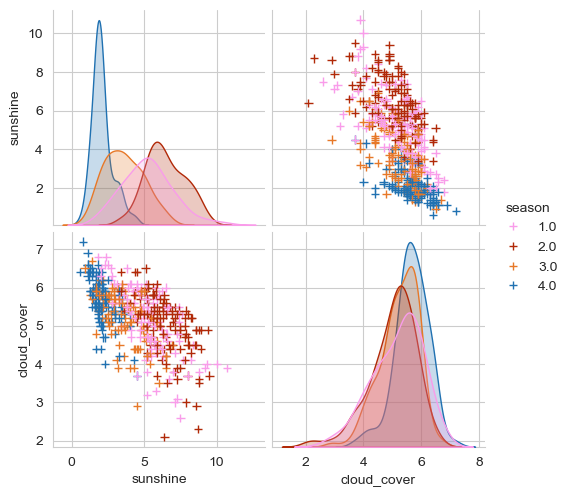

In [179]:
AT_H = monthly_data[['sunshine','cloud_cover','season']]
sns.pairplot(AT_H, 
             hue='season', palette=palette, 
             kind='scatter',
             plot_kws=dict(marker='+', linewidth=1),
            )

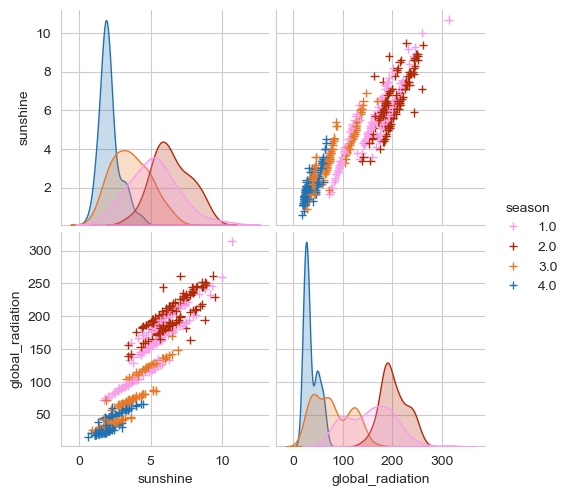

In [181]:
AT_H = monthly_data[['sunshine','global_radiation','season']]
sns.pairplot(AT_H, 
             kind='scatter',
             hue='season', palette=palette,
             plot_kws=dict(marker='+', linewidth=1),
            )

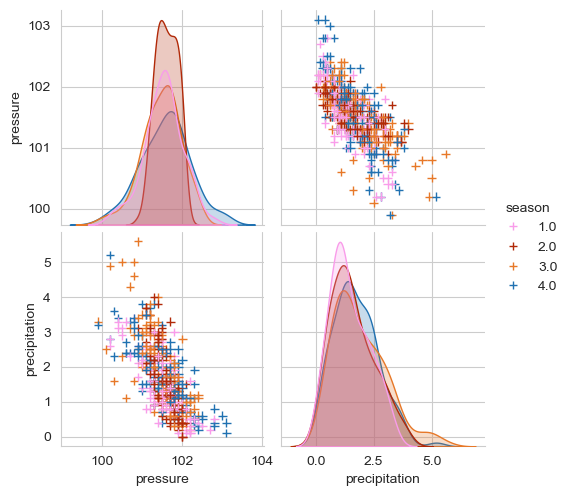

In [183]:
AT_H = monthly_data[['pressure','precipitation','season']]
sns.pairplot(AT_H, 
             kind='scatter',
             hue='season', palette=palette,
             plot_kws=dict(marker='+', linewidth=1),
            )

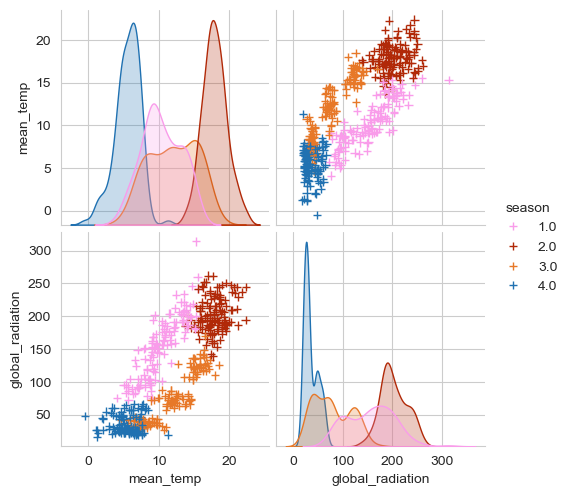

In [185]:
AT_H = monthly_data[['mean_temp','global_radiation','season']]
sns.pairplot(AT_H, 
             kind='scatter',
             hue='season', palette=palette,
             plot_kws=dict(marker='+', linewidth=1),
            )

## Monthly Temperature and Irradiance 

FacetGrid object takes a data frame as input and the names of the variables that will form the row, column, or hue dimensions of the grid. The variables should be categorical and the data at each level of the variable will be used for a facet along that axis.

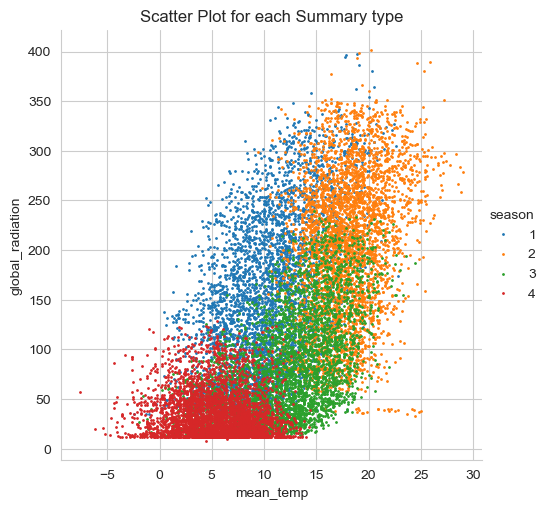

In [138]:
sns.FacetGrid(df, hue="season", height=5, aspect=1).map(plt.scatter, "mean_temp", "global_radiation", s=1).add_legend()
plt.title("Scatter Plot for each Summary type")
plt.show()

## Preparing Data for Prophet

In [141]:
from prophet import Prophet

In [142]:
'''
# WMAPE (Weighted Mean Absolute Percentage Error)
def wmape(y_true, y_pred):
    return np.abs(y_true - y_pred).sum() / np.abs(y_true).sum()
'''
df2 = df[["date","mean_temp"]]
df2['date']=pd.to_datetime(df2['date'])
df2.rename(columns = {'date':'ds'}, inplace = True)
df2.rename(columns = {'mean_temp':'y'}, inplace = True)

m = Prophet()
m.fit(df2)



/var/folders/k4/jzq2s7kj6k9053ps6nmw21fw0000gn/T/ipykernel_18044/1255433099.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['date']=pd.to_datetime(df2['date'])
/var/folders/k4/jzq2s7kj6k9053ps6nmw21fw0000gn/T/ipykernel_18044/1255433099.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.rename(columns = {'date':'ds'}, inplace = True)
/var/folders/k4/jzq2s7kj6k9053ps6nmw21fw0000gn/T/ipykernel_18044/1255433099.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://p

In [144]:
df2.head()

,ds,y
0,1979-01-01,-4.1
1,1979-01-02,-2.6
2,1979-01-03,-2.8
3,1979-01-04,-2.6
4,1979-01-05,-0.8


In [145]:
future = m.make_future_dataframe(periods=(365))
future.tail()

,ds
15701,2021-12-27
15702,2021-12-28
15703,2021-12-29
15704,2021-12-30
15705,2021-12-31


In [146]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
15701,2021-12-27,6.964156,3.632085,10.674087
15702,2021-12-28,6.926115,3.345248,10.589547
15703,2021-12-29,6.963214,3.291780,10.530536
15704,2021-12-30,6.910579,3.043945,10.529839
15705,2021-12-31,6.845199,3.469224,10.692224


/Users/nadezdagileva/anaconda3/lib/python3.11/site-packages/prophet/plot.py:71: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/Users/nadezdagileva/anaconda3/lib/python3.11/site-packages/prophet/plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',


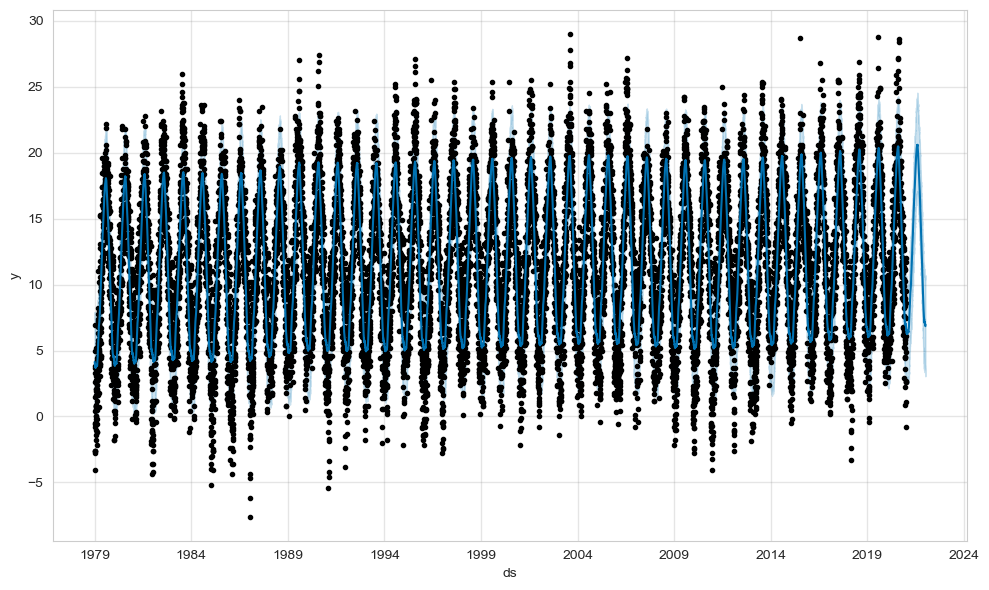

In [151]:
figure = m.plot(forecast)

/Users/nadezdagileva/anaconda3/lib/python3.11/site-packages/prophet/plot.py:226: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/Users/nadezdagileva/anaconda3/lib/python3.11/site-packages/prophet/plot.py:349: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  df_y['ds'].dt.to_pydatetime(), seas[name], ls='-', c='#0072B2')
/Users/nadezdagileva/anaconda3/lib/python3.11/site-packages/prophet/plot.py:352: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead 

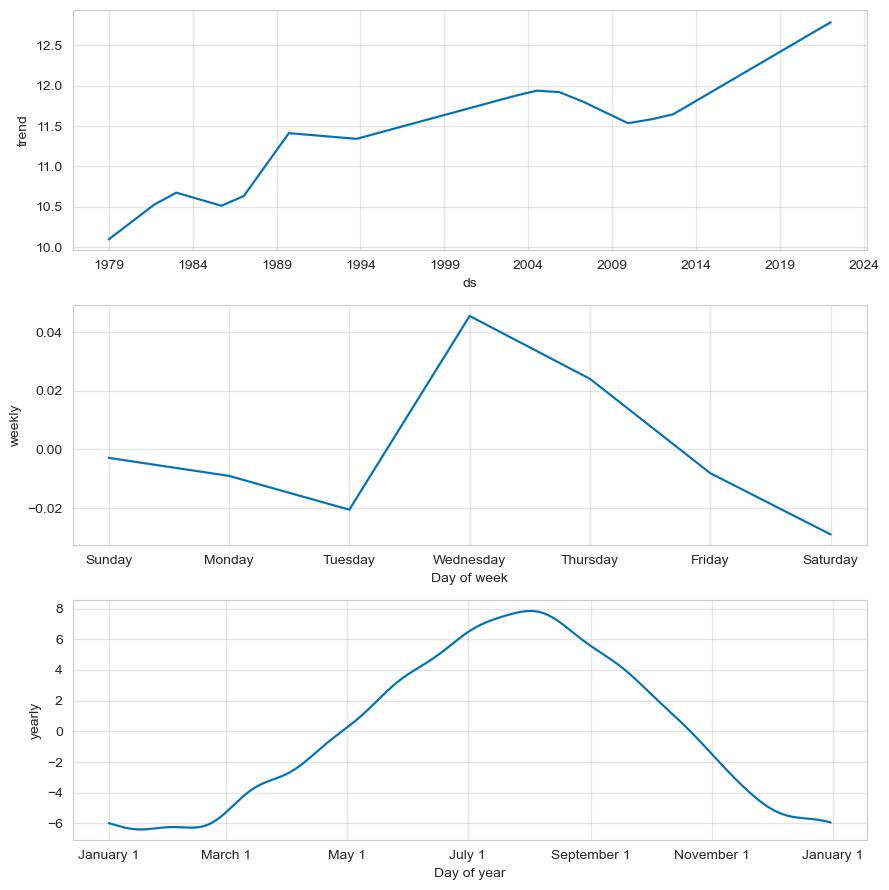

In [152]:
# Forecast components (trend, weekly, yearly)
figure2 = m.plot_components(forecast)

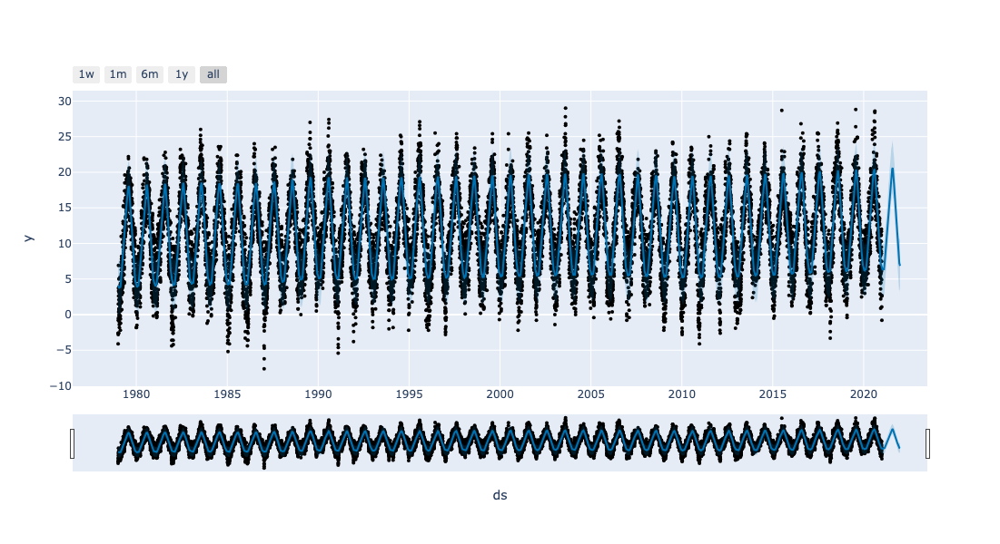

In [155]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m, forecast)

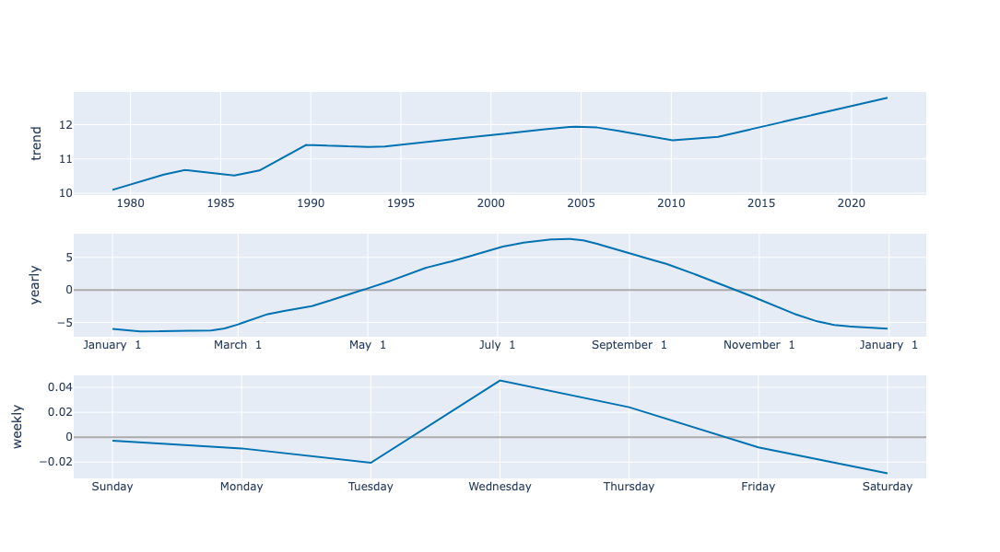

In [156]:
plot_components_plotly(m, forecast)